# Feature Engineering

In [ ]:
# !pip install numpy pandas regex tqdm pickle-mixin nltk sklearn fasttext textacy umap plotly seaborn spacy pickle5
# !python -m spacy download en_core_web_sm 
# !pip install pickle5

In [2]:
import numpy as np
import pandas as pd
import regex as re
from collections import Counter
from tqdm import tqdm
import plotly.graph_objects as go
# import pickle5 as pickle
import pickle as pickle # Depends on your version of python
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
import fasttext
import fasttext.util
import textacy
from textacy.text_stats import TextStats
import warnings
import sys
import os

warnings.filterwarnings("once")
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
en = textacy.load_spacy_lang("en_core_web_sm", disable=("parser",))
ft = fasttext.load_model('./wordembed/wiki.en.bin') # https://fasttext.cc/docs/en/pretrained-vectors.html
fasttext.util.reduce_model(ft,50)

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\MattDannheisser\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\MattDannheisser\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MattDannheisser\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\MattDannheisser\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


# File Paths

In [ ]:
# We have stored our files in a shared drive on Google Drive
# You may be asked to enter your authorization code to mount the drive
# Alternatively, download the files as mentioned above and run it in your local directory or google drive.
# from google.colab import drive
# drive.mount('/content/drive')

In [15]:
#file paths

wiki_train = "datasets/WikiLarge_Train.csv"
wiki_test = "datasets/WikiLarge_Test.csv"
aoa_words = "datasets/AoA_51715_words.csv"
concreteness_ratings = "datasets/Concreteness_ratings_Brysbaert_et_al_BRM.txt"
dale_chall = "datasets/dale_chall.txt"
sat_words= 'datasets/SAT_words.xlsx'

# Understanding the Data

In [18]:
train_df = pd.read_csv(wiki_train)
print(train_df.shape)
train_df.head()

(416768, 2)


,original_text,label
0,There is manuscript evidence that Austen conti...,1
1,"In a remarkable comparative analysis , Mandaea...",1
2,"Before Persephone was released to Hermes , who...",1
3,Cogeneration plants are commonly found in dist...,1
4,"Geneva -LRB- , ; , ; , ; ; -RRB- is the second...",1


In [19]:
test_df = pd.read_csv(wiki_test).drop(columns='id')
print(test_df.shape)
test_df.sample(5)

(119092, 2)


,original_text,label
400,'' Like the Angel '' -- 2:46,NaN
111923,To get an acceptable typesetting result some p...,NaN
16409,"Blogcritics.org -LRB- January 22 , 2004 -RRB- ...",NaN
40537,"However , a masked marauder , the '' Blue Spir...",NaN
48140,Inca empire A number of mummies of sacrificed ...,NaN


In [20]:
# Need to review how to understand this table.
# How to handle zero values or other missing data.
# We might need to handle via missing data imputation, possibly matching with word embeddings and imputer classes in sklearn.
concrete_df = pd.read_csv(concreteness_ratings, delimiter = "\t")
print(concrete_df.shape)
concrete_df.head()

(39954, 9)


,Word,Bigram,Conc.M,Conc.SD,Unknown,Total,Percent_known,SUBTLEX,Dom_Pos
0,roadsweeper,0,4.85,0.37,1,27,0.96,0,0
1,traindriver,0,4.54,0.71,3,29,0.90,0,0
2,tush,0,4.45,1.01,3,25,0.88,66,0
3,hairdress,0,3.93,1.28,0,29,1.00,1,0
4,pharmaceutics,0,3.77,1.41,4,26,0.85,0,0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000158B4E0BE88>,
      dtype=object)

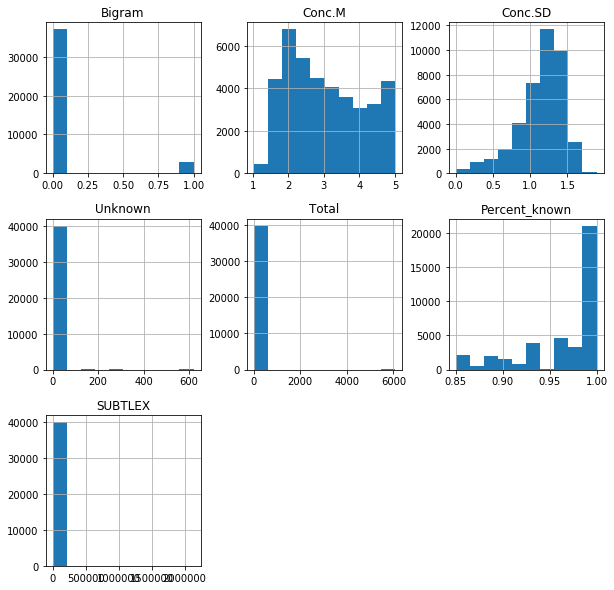

In [21]:
concrete_df.hist(figsize=(10,10))

In [22]:
concrete_df.describe()

,Bigram,Conc.M,Conc.SD,Unknown,Total,Percent_known,SUBTLEX
count,39954.000000,39954.000000,39954.000000,39954.000000,39954.000000,39954.000000,3.995400e+04
mean,0.072483,3.036267,1.148359,0.999825,33.195450,0.965562,1.077803e+03
std,0.259290,1.038602,0.310931,3.745465,174.829539,0.045009,2.242037e+04
min,0.000000,1.040000,0.000000,0.000000,21.000000,0.850000,0.000000e+00
25%,0.000000,2.120000,1.000000,0.000000,27.000000,0.930000,0.000000e+00
50%,0.000000,2.880000,1.210000,0.000000,28.000000,1.000000,1.000000e+01
75%,0.000000,3.890000,1.370000,2.000000,29.000000,1.000000,6.700000e+01
max,1.000000,5.000000,1.890000,620.000000,6072.000000,1.000000,2.134713e+06


In [23]:
# Double check if import is correct. Had to do unicode issues.
# Most relevent columns seem to be Freq_PM (word's frequency of use) & AoA_Kup_Lem (age the word is understood)
# Uncomment to see distrobution

aoa_df = pd.read_csv(aoa_words, encoding= 'unicode_escape')
print(aoa_df.shape)
aoa_df.head()

(51715, 16)


,Word,Alternative.spelling,Freq_pm,Dom_PoS_SUBTLEX,Nletters,Nphon,Nsyll,Lemma_highest_PoS,AoA_Kup,Perc_known,AoA_Kup_lem,Perc_known_lem,AoA_Bird_lem,AoA_Bristol_lem,AoA_Cort_lem,AoA_Schock
0,a,a,20415.27,Article,1,1,1,a,2.89,1.00,2.89,1.00,3.16,NaN,NaN,NaN
1,aardvark,aardvark,0.41,Noun,8,7,2,aardvark,9.89,1.00,9.89,1.00,NaN,NaN,NaN,NaN
2,abacus,abacus,0.24,Noun,6,6,3,abacus,8.69,0.65,8.69,0.65,NaN,NaN,NaN,NaN
3,abacuses,abacuses,0.02,Noun,8,9,4,abacus,NaN,NaN,8.69,0.65,NaN,NaN,NaN,NaN
4,abalone,abalone,0.51,Verb,7,7,4,abalone,12.23,0.72,12.23,0.72,NaN,NaN,NaN,NaN


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000158BE992B48>,
      dtype=object)

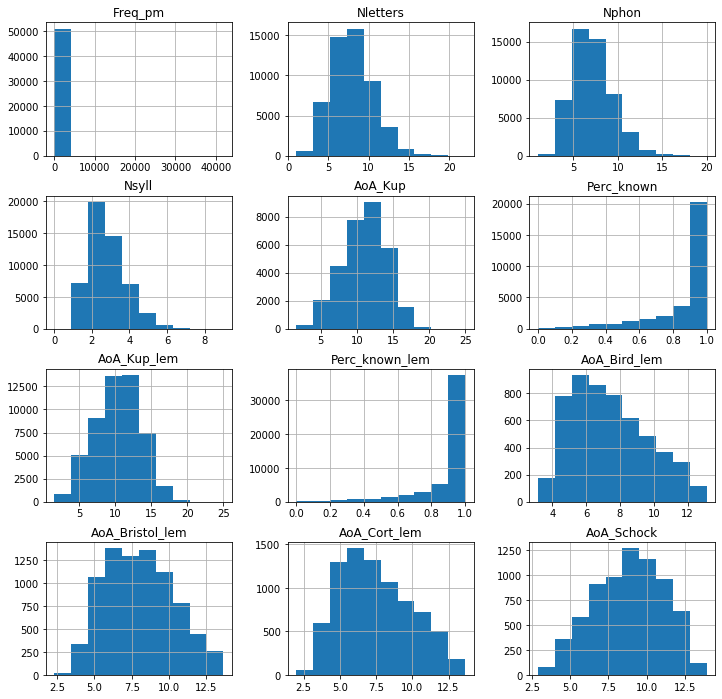

In [24]:
#by label
aoa_df.hist(figsize= (12,12))
# aoa_df[aoa_df['Freq_pm']>500]['Freq_pm'].hist()

In [25]:
# These are simple words.
# We need to count how many of these are in each passage.
dale_df = pd.read_csv(dale_chall,delimiter="\t")
dale_df= dale_df['a'].map(lambda word: WordNetLemmatizer().lemmatize(word=word))
# print(dale_df.shape)

dale_set= set(dale_df.unique())

# print(dale_df.head())
# del dale_df

In [26]:
# List of 6,0000 SAT words and there definitions and POS
# We will count and make averge features
# sat_df= pd.read_excel(sat_words)

# If read_excel fails, it may require the following lines:
sat_df = pd.read_excel(sat_words,engine='openpyxl')
sat_df = sat_df[["WORD","DEFINITION","GROUPING"]]

print(sat_df.shape)
sat_df.head()



(6000, 3)


,WORD,DEFINITION,GROUPING
0,abash,to make ashamed,verb
1,abate,to put an end to,verb
2,abbess,a female superior or governess of a nunnery,noun
3,abbey,a monastery or society of people,noun
4,abbot,the superior or head of an abbey or monastery,noun


**End Goal:** To output pickle files with different representations of the text data for use in downstream tasks such as unsupervised and supervised learning.

# Data Transformations

In [27]:
import warnings
warnings.filterwarnings("once")

In [28]:
WNL= WordNetLemmatizer()
stop_words= list(stopwords.words('english'))

#=============================================================================================

def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

#==========================================================================================

def create_dale_chall_features(dale_df=dale_set, data_df=train_df):
  '''
  Create the following collumns to be added to train & test sets:
  - Word list- List of non-stop words
  - Word Counts- Lemmatized word counter with sopwords removed for subsequent functions
  - TTR- Type Token Ration (Unique words / total words in passage)
  - Passage Sum- total number of terms in passage.
  - Dale Chall Sum- intersecting total word count. The total amount of elementary words.
  - Dale Chall Percent- intersecting word count divided by the total amount of words in passage. The % prevalence of elementary words in a passage.
  
  Notes: There is a distinction made between words and terms. Words include all whitespace seperated entities. Terms are lemmatized non-stop words.
  
  return dataframe with column(s) added
  '''
  print('Creating Dale-Chall')
  # data_df['Word Counts']= [re.findall('\w+', WNL.lemmatize(text.lower())) for text in data_df.original_text]
  # data_df['Word Counts']= [Counter]
  word_count_list=[]
  TTR_list= []

  for passage in tqdm(data_df.original_text):
    word_list= word_tokenize(passage.lower())
    TTR_list.append(len(pd.unique(word_list)) / len(word_list))
    lemm_stopped_list= [WNL.lemmatize(word, get_wordnet_pos(word)) for word in word_list if word not in stop_words]
    word_count_list.append(Counter(lemm_stopped_list))
  data_df["word_list"] = data_df["original_text"].apply(lambda x: [word for word in re.findall(r'\w+', x.lower()) if word not in stop_words])
  data_df['Word Counts']= word_count_list
  data_df['TTR']= TTR_list
  
  sums= []
  passage_sums= []

  for words in data_df['Word Counts']:
    word_intersect= dale_set.intersection(set(words))
    sums.append(sum([words[w] for w in word_intersect]))
    passage_sums.append(sum(words.values()))
  data_df['Dale Chall Sum']= sums 
  data_df['Passage Sum']= passage_sums
  data_df['Dale Chall Percent']= data_df['Dale Chall Sum'] / data_df['Passage Sum']

  
  return data_df

# =============================================================================

def create_AoA_features(aoa_df=aoa_df.copy(), data_df=train_df):
  '''
  Create the following collumns to be added to train & test sets:
  - AoA_Freq- average of Freq_pm words within each passage
  - AoA_Mean_Age- average of AoA_Kup_lem within each passage
  - Sqrd_AoA_Mean_Age- average of squared AoA_Kup_lem in each passage
  - Min_AoA_Age
  - Max_AoA_Age
  
  return df with column(s) added
  '''

  print('Creating AoA')
  mean_freq_list= []
  mean_age_list= []
  sqrd_mean_age_list= []
  max_age_list= []
  min_age_list= []

  aoa_df= aoa_df.drop_duplicates('Lemma_highest_PoS') # drop duplicates because AoA age same for all lem groups (Aoa_Freq is not)

  for words in tqdm(data_df['Word Counts'], total= len(data_df['Word Counts'])):
    line_freq_list= []
    line_age_list= []
    sqrd_line_age_list= []
    line_max_age_list= []
    line_min_age_list= []
    intersect= aoa_df[aoa_df['Word'].isin(words.keys())][['Word','Freq_pm','AoA_Kup_lem']]
    
    for i, row in intersect.iterrows():
      line_freq_list.append(row['Freq_pm'] * words[row['Word']])
      line_age_list.append(row['AoA_Kup_lem'] * words[row['Word']])
      sqrd_line_age_list.append(row['AoA_Kup_lem']**2 *words[row['Word']])
      line_max_age_list.append(row['AoA_Kup_lem'])
      line_min_age_list.append(row['AoA_Kup_lem'])

    if sum(line_freq_list) > 0:
      mean_freq_list.append(sum(line_freq_list) / sum(words.values()))
    else:
      mean_freq_list.append(np.NaN)
    if sum(line_age_list) > 0:
      mean_age_list.append(sum(line_age_list) / sum(words.values()))
      sqrd_mean_age_list.append(sum(sqrd_line_age_list) / sum(words.values()))
      max_age_list.append(max(line_max_age_list))
      min_age_list.append(min(line_min_age_list))
    else: 
      mean_age_list.append(np.NaN)
      sqrd_mean_age_list.append(np.NaN)
      max_age_list.append(np.NaN)
      min_age_list.append(np.NaN)

  data_df['AoA_Freq']= mean_freq_list
  data_df['AoA_Mean_Age']= mean_age_list
  data_df['Sqrd_AoA_Mean_Age']= sqrd_mean_age_list
  data_df['Max_AoA_Age']= max_age_list
  data_df['Min_AoA_Age']= min_age_list
  
  return data_df


# =============================================================================

def create_sat_word_count(sat_df=sat_df, data_df=train_df):
  '''
  Create the following collumns to be added to train & test sets:
  - intersecting word count
  - intersection word count divided by size of passage
  
  return dataframe with column(s) added
  '''

  print('Creating SAT')
  sat_set= set(sat_df.iloc[:,0].unique())
  sums= []
  passage_sums= []
  for words in tqdm(data_df['Word Counts'], total= len(data_df['Word Counts'])):
    word_intersect= sat_set.intersection(set(words))
    sums.append(sum([words[w] for w in word_intersect]))
    passage_sums.append(sum(words.values()))
  data_df['SAT Sum']= sums 
  data_df['SAT Percent']= data_df['SAT Sum'] / passage_sums
  
  return data_df

# =============================================================================

def create_concreteness_features(concrete=concrete_df, data_df=train_df):
  '''
  Create the following collumns to be added to train & test sets:
  - Conc.M- average of Conc.m (concrete mean rating)
  -Conc.M_sqrd- average of squared(Conc.m)
  - Percent_known- average of Percent_known (percent of people who knew the word)
  
  return df with column(s) added
  '''

  print('Creating Concrete')
  mean_concrete_list= []
  mean_percent_list= []
  sq_mean_concrete_list= []

  unigram= concrete[concrete['Bigram']==0]
  bigram= concrete[concrete['Bigram']==1]

  for words in tqdm(data_df['Word Counts'], total= len(data_df['Word Counts'])):
    line_concrete_list= []
    line_percent_list= []
    sq_line_concrete_list= []

    # code for unigrams matching
    #  ============================
    intersect= unigram[unigram['Word'].isin(words.keys())][['Word','Conc.M','Percent_known']]

    # print(intersect)
    # print('=====================')

    for i, row in intersect.iterrows():
      line_concrete_list.append(row['Conc.M'] * words[row['Word']])
      line_percent_list.append(row['Percent_known'] * words[row['Word']])
      sq_line_concrete_list.append(row['Conc.M']**2 * words[row['Word']])

    if sum(line_concrete_list) > 0:
      mean_concrete_list.append(sum(line_concrete_list) / sum(words.values()))
    else:
      mean_concrete_list.append(np.NaN)
    if sum(line_percent_list) > 0:
      mean_percent_list.append(sum(line_percent_list) / sum(words.values()))
    else: 
      mean_percent_list.append(np.NaN)
    if sum(sq_line_concrete_list) > 0:
      sq_mean_concrete_list.append(sum(sq_line_concrete_list) / sum(words.values()))
    else:
      sq_mean_concrete_list.append(np.NaN)
    
    # intersect= bigram[bigram['Word'].isin(words.keys())][['Word','Concrete_m','Percent_known']]


  data_df['Conc.M']= mean_concrete_list
  data_df['Conc.M_sqrd']= sq_mean_concrete_list
  data_df['Percent_known']= mean_percent_list
  return data_df

  #==========================================================================  
def word_pos(word):
  '''
  Creates columns for pronoun count and pronoun percent in sentence.
  Implemented for each word
  '''
  if nltk.pos_tag([word])[0][1][0:3] == 'PRP':
      return 1
  else:
      return 0

def create_pronoun_feat(df=train_df):
  print('Create Pronoun Feature')
  pronoun_count_list= []
  pronoun_percent_list= []
  for passage in tqdm(df.original_text):
      pronoun_count= 0
      word_list= word_tokenize(passage.lower())
      for word in word_list:
          pronoun_count+= word_pos(word)
      pronoun_count_list.append(pronoun_count)
      pronoun_percent_list.append(pronoun_count / len(word_list))
  df['Pronoun Count']= pronoun_count_list
  df['Pronoun Percent']= pronoun_percent_list
  return df
#==============================================================================

def add_r_scores(df,textcolumn="original_text"):
  """
  Takes a df with a text column and adds columns for each readability score.

  Args:
  df -- input df
  textcolumn -- str of name of column. Default is original_text

  returns:
  df -- df with columns added for each readability score
      

  """
  print('Creating Readability Scores')

  # Create a small function to handle error handling in readability scores
  def get_r_score(text_object,score_name):
        
      try:
          score = getattr(text_object,score_name)
      except:
          score = None
      return score

  # List of scores to calculate
  # Focusing mainly on english relevant scores
  r_scores = ["automated_readability_index",
              "coleman_liau_index",
              "flesch_kincaid_grade_level",
              "flesch_reading_ease",
              "gunning_fog_index",
              "lix",
              "perspicuity_index",
              "smog_index"]

  # Create a column with the textacy object
  # We will use tqdm pandas to help check on our progress.
  tqdm.pandas()
  df["ts"] = df[textcolumn].progress_apply(lambda t: TextStats(textacy.make_spacy_doc(t,lang=en)))

  # Loop through list of scores, calculate them, and insert into df
  for r in tqdm(r_scores):
      df[r] = df["ts"].progress_apply( lambda t: get_r_score(text_object=t,score_name=r) )

  # We can drop the textobject column to save space and make it easier to pickle
  df.drop(columns=["ts"],inplace=True)

  return df

#=============================================================================
def create_sentence_embeddings(data_df=train_df):
  print('Creating Sentence Embeddings')
  data_df["sentence_embed"] = data_df["original_text"].apply(
    lambda text: ft.get_sentence_vector(text))
  
  print('Creating Word Embeddings')

  data_df["word_embed"] = data_df["word_list"].apply(
    lambda text: [ft[word] for word in text])
  data_df["Average_Embed"] = data_df["sentence_embed"].apply(
    lambda l: np.mean(l))
  return data_df 
  
#=======================================================================

def create_failure_word_matches(df=train_df):
  '''
  Creates the word matching columns that were inspired by our failure analysis.
  - 1 for existing
  - 0 for non-existing
  '''
  football_boolean_list= []
  commune_boolean_list= []
  wiki_tag_boolean_list= []

  for passage in tqdm(df.original_text):
    if 'football' in passage.lower():
      football_boolean_list.append(1)
    else:
      football_boolean_list.append(0)
    if 'commune' in passage.lower():
      commune_boolean_list.append(1)
    else:
      commune_boolean_list.append(0)
    if '-LRB-|-RRB-' in passage.lower():
      wiki_tag_boolean_list.append(1)
    else:
      wiki_tag_boolean_list.append(0)
  df['commune_matched']= commune_boolean_list
  df['football_matched']= football_boolean_list
  df['LRB_RRB_matched']= wiki_tag_boolean_list

  return df

### Creating the Features



In [29]:
# Create some samples for testing purposes
sample_df_0= train_df[train_df['label']==0].sample(frac=.001)
sample_df_1= train_df[train_df['label']==1].sample(frac=.001)
sample_df= sample_df_0.append(sample_df_1)

In [30]:
# You can replace your df here with either the full df or a sample.
df= sample_df 

train_df= create_dale_chall_features(data_df=df)
train_df= create_sat_word_count(data_df=df)
train_df= create_AoA_features(data_df=df)
train_df= create_concreteness_features(data_df=df)
train_df= add_r_scores(df=df)
train_df= create_pronoun_feat(df= df)
train_df= create_sentence_embeddings(data_df= df)
train_df= create_failure_word_matches(df= df)


Creating Dale-Chall


100%|███████████████████████████████████████████████████████████████████████████████| 416/416 [00:03<00:00, 137.63it/s]


Creating SAT


100%|████████████████████████████████████████████████████████████████████████████| 416/416 [00:00<00:00, 207990.28it/s]


Creating AoA


100%|███████████████████████████████████████████████████████████████████████████████| 416/416 [00:01<00:00, 399.04it/s]


Creating Concrete


100%|███████████████████████████████████████████████████████████████████████████████| 416/416 [00:01<00:00, 348.40it/s]


Creating Readability Scores


100%|█████████████████████████████████████████████████████████████████████████████| 416/416 [00:00<00:00, 21863.13it/s]

100%|████████████████████████████████████████████████████████████████████████████| 416/416 [00:00<00:00, 205250.03it/s]

100%|████████████████████████████████████████████████████████████████████████████| 416/416 [00:00<00:00, 429761.20it/s]

100%|████████████████████████████████████████████████████████████████████████████| 416/416 [00:00<00:00, 207767.38it/s]

100%|████████████████████████████████████████████████████████████████████████████| 416/416 [00:00<00:00, 438730.32it/s]

100%|█████████████████████████████████████████████████████████████████████████████| 416/416 [00:00<00:00, 59200.98it/s]

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 27.87it/s]


Create Pronoun Feature


100%|███████████████████████████████████████████████████████████████████████████████| 416/416 [00:04<00:00, 102.19it/s]


Creating Sentence Embeddings
Creating Word Embeddings


100%|████████████████████████████████████████████████████████████████████████████████████████| 416/416 [00:00<?, ?it/s]


In [31]:
# Check the dataframe for our engineered features
train_df.head()

,original_text,label,word_list,Word Counts,TTR,Dale Chall Sum,Passage Sum,Dale Chall Percent,SAT Sum,SAT Percent,...,perspicuity_index,smog_index,Pronoun Count,Pronoun Percent,sentence_embed,word_embed,Average_Embed,commune_matched,football_matched,LRB_RRB_matched
242608,The valley of the Ruwer is a part of the wine-...,0,"[valley, ruwer, part, wine, growing, region, m...","{'valley': 1, 'ruwer': 1, 'part': 1, 'wine-gro...",0.833333,3,10,0.300000,0,0.000000,...,102.768333,8.841846,0,0.0,"[0.17008887, 0.11635355, 0.17924389, 0.0727900...","[[0.6265286, 1.0881277, 0.89999634, -0.3027713...",-0.003312,0,0,0
375184,South of Flensburg and Flensburg wanted to sta...,0,"[south, flensburg, flensburg, wanted, stay, ge...","{'south': 1, 'flensburg': 3, 'want': 1, 'stay'...",0.809524,6,14,0.428571,0,0.000000,...,105.861316,3.129100,0,0.0,"[0.11654443, 0.1461171, 0.15022397, 0.20618439...","[[0.6395226, 1.2879447, 0.9390944, 0.011225526...",0.001187,0,0,0
324555,This led competing networks Smart Communicatio...,0,"[led, competing, networks, smart, communicatio...","{'lead': 1, 'compete': 1, 'network': 1, 'smart...",1.000000,4,12,0.333333,1,0.083333,...,81.810000,13.023867,0,0.0,"[0.20429334, 0.010100946, 0.0721706, 0.2348193...","[[-0.17948298, 0.65081435, 0.46374187, 0.61295...",0.009418,0,0,0
295820,List of acronyms and initialisms,0,"[list, acronyms, initialisms]","{'list': 1, 'acronym': 1, 'initialisms': 1}",1.000000,1,3,0.333333,0,0.000000,...,102.155000,8.841846,0,0.0,"[0.10136763, -0.1754802, 0.09219238, 0.2044126...","[[0.67263556, -0.07095434, -0.07983123, 0.6830...",-0.009143,0,0,0
245273,There are simple algorithms to calculate media...,0,"[simple, algorithms, calculate, median, mean, ...","{'simple': 1, 'algorithm': 1, 'calculate': 1, ...",0.904762,3,16,0.187500,0,0.000000,...,95.723235,11.208143,0,0.0,"[0.31198898, -0.11671565, 0.017236441, 0.18768...","[[0.76111686, -1.1256305, -0.20340267, 0.13263...",-0.000852,0,0,0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000158C830BCC8>,
      dtype=object)

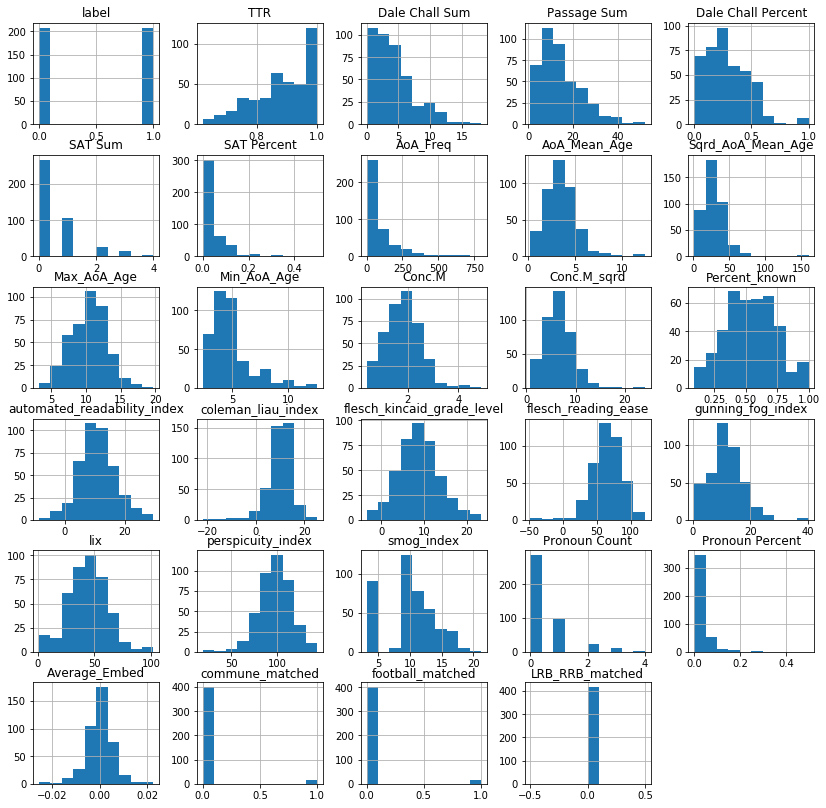

In [32]:
# train_df.to_pickle('./pkl/train_df.pkl')

# train_df= pickle.load(open('/pickles/train_df.pkl','rb'))

train_df.hist(figsize=(14,14))

In [33]:
def generate_plots(df,feature_list):
    rows_0 = df[df["label"] == 0]
    rows_1 = df[df["label"] == 1]
    for feat in feature_list:
        x0 = rows_0[feat]
        x1 = rows_1[feat]
        fig = go.Figure()
        fig.add_trace(go.Histogram(x=x0,name="Simple"))
        fig.add_trace(go.Histogram(x=x1,name="Complex"))
        # Overlay both histograms
        fig.update_layout(width=600,height=400,barmode='overlay',title=go.layout.Title(text=f"Distribution of {feat} by Difficulty Label"))
        # Reduce opacity to see both histograms
        fig.update_traces(opacity=0.75)
        fig.update_layout(legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="left",
        ))
        fig.show()

In [34]:
features= ['TTR', 'Dale Chall Sum', 'Passage Sum', 'Dale Chall Percent', 'SAT Sum',
       'SAT Percent', 'AoA_Freq', 'AoA_Mean_Age', 'Sqrd_AoA_Mean_Age',
       'Max_AoA_Age', 'Min_AoA_Age', 'Conc.M', 'Conc.M_sqrd', 'Percent_known',
       'sentence_embed', 'word_embed', 'Average_Embed',
       'automated_readability_index', 'coleman_liau_index',
       'flesch_kincaid_grade_level', 'flesch_reading_ease',
       'gunning_fog_index', 'lix', 'perspicuity_index', 'smog_index',
       'Pronoun Count', 'Pronoun Percent', 'commune_matched',
       'football_matched', 'LRB_RRB_matched']
generate_plots(train_df, features)

In [35]:
sample_df= test_df.sample(frac=.001)

In [38]:
df=sample_df


test_df= create_dale_chall_features(data_df=df)
test_df= create_sat_word_count(data_df=df)
test_df= create_AoA_features(data_df=df)
test_df= create_concreteness_features(data_df=df)
test_df= add_r_scores(test_df)
test_df= create_pronoun_feat(df)
test_df= create_sentence_embeddings(data_df= df)
test_df= create_failure_word_matches(df= df)

# test_df= pickle.load(open('/content/drive/Shareddrives/Milestone 2 - James Mete - Matt Dannheisser/notebooks/pickles/test_df.pkl','rb'))


Creating Dale-Chall


100%|███████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 150.42it/s]


Creating SAT


100%|████████████████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<?, ?it/s]


Creating AoA


100%|███████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 389.25it/s]


Creating Concrete


100%|███████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 376.66it/s]


Creating Readability Scores


100%|█████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 23631.56it/s]

100%|████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 119037.01it/s]

100%|█████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 29493.72it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<?, ?it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<?, ?it/s]

100%|████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 119008.63it/s]

100%|█████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<00:00, 39146.84it/s]

100%|███████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 181.66it/s]


Create Pronoun Feature


100%|███████████████████████████████████████████████████████████████████████████████| 119/119 [00:01<00:00, 109.28it/s]


Creating Sentence Embeddings
Creating Word Embeddings


100%|████████████████████████████████████████████████████████████████████████████████████████| 119/119 [00:00<?, ?it/s]


In [40]:
# test_df.to_pickle('./pkl/test_df.pkl')